
# E2 - Data Drift in Used Vehicle Price Prediction

## Introduction

- 1.2 Million listings scraped from TrueCar.com - Price, Mileage, Make, Model dataset from Kaggle: [data](https://www.kaggle.com/jpayne/852k-used-car-listings)
- Each observation represents the price of an used car

In [ ]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
data = pd.read_csv('https://github.com/sergiomora03/AdvancedTopicsAnalytics/raw/main/datasets/dataTrain_carListings.zip')

In [ ]:
data.head()

,Price,Year,Mileage,State,Make,Model
0,21490,2014,31909,MD,Nissan,MuranoAWD
1,21250,2016,25741,KY,Chevrolet,CamaroCoupe
2,20925,2016,24633,SC,Hyundai,Santa
3,14500,2012,84026,OK,Jeep,Grand
4,32488,2013,22816,TN,Jeep,Wrangler


In [ ]:
data.shape

(500000, 6)

In [ ]:
data.columns

Index(['Price', 'Year', 'Mileage', 'State', 'Make', 'Model'], dtype='object')

## Exercise P0.1 (20%)

Complete an exploratory data analysis with the variables in the dataset to determine the relationships between the vehicle price (target feature) and the other features. Remember to separate the analysis between bivariate and multivariate, in order to see the effects of each feature separately and then with a set of features.

**ANSWER**

First, we started looking for basic sthatistical despcription, such as frecuency, average, standar deviation. It can only happen in numerical variables such as price, year and mileage. With the other features, we are gonna count frecuency per category.

In [ ]:
data.Mileage.describe()

,Mileage
count,5.000000e+05
mean,5.507643e+04
std,4.089704e+04
min,5.000000e+00
25%,2.585500e+04
50%,4.299000e+04
75%,7.740600e+04
max,2.457832e+06


The dataset, representing the mileage of 500,000 cars, shows an average mileage of 55,076 miles, with significant variability (standard deviation of 40,897 miles), indicating a wide range of usage. Most cars fall within a moderate range, with 25% driven 25855 miles or less (likely newer cars) and 75% driven 77406 miles or less. The presence of very low (e.g., 5 miles) and extremely high mileages suggests a mix of nearly new, used, and potentially commercial or anomalous vehicles.

In [ ]:
data.Year.describe()

,Year
count,500000.000000
mean,2013.197174
std,3.290135
min,1997.000000
25%,2012.000000
50%,2014.000000
75%,2016.000000
max,2018.000000


The dataset, representing the manufacturing years of 500,000 cars, shows an average year of 2013, with relatively low variability (standard deviation of 3.29 years), indicating that most cars are clustered around this period.  The majority of cars are relatively recent, with 25% manufactured in 2012 or earlier, 50% in 2014 or earlier, and 75% in 2016 or earlier. The oldest car dates back to 1997, while the newest is from 2018. This indicates a prevalence of modern vehicles in the dataset, with a small proportion of older models

In [ ]:
data.Price.describe()

,Price
count,500000.000000
mean,21144.186304
std,10753.259704
min,5001.000000
25%,13499.000000
50%,18450.000000
75%,26998.000000
max,79999.000000


The dataset, representing the prices of 500,000 cars, shows an average price of 21144. The cheapest car is priced at 5001, while the most expensive reaches 79999, suggesting the presence of luxury or specialty vehicles.

In [ ]:
make_counts = data['Make'].value_counts(normalize=True) * 100
make_counts.head()


,proportion
Make,
Ford,15.7254
Chevrolet,14.5800
Toyota,11.4970
Honda,8.2980
Jeep,6.0826


The dataset shows the market share proportions of five car manufacturers: Ford leads with 15.7%, followed closely by Chevrolet at 14.6%, reflecting the strong presence of American automakers. Toyota holds 11.5%, ranking third, while Honda accounts for 8.3%, highlighting the popularity of Japanese brands known for reliability. Jeep, with 6.1%, represents a smaller, niche segment focused. Together, Ford, Chevrolet, and Toyota dominate 41.8% of the market, indicating a concentrated market with a few key players.

In [ ]:
make_counts = data['State'].value_counts(normalize=True) * 100
make_counts.head()

,proportion
State,
TX,11.4306
CA,9.1286
FL,8.4488
GA,4.5580
NC,4.4726


The dataset shows the proportion of vehicles located in five U.S. states: Texas (TX) leads with 11.4%, followed by California (CA) at 9.1% and Florida (FL) at 8.4%, reflecting the high population and vehicle density in these large states. Georgia (GA) and North Carolina (NC) have smaller but still significant shares, at 4.6% and 4.5%, respectively. Together, the top three states (TX, CA, and FL) account for 29.0% of the vehicles, highlighting their dominance in the dataset. This distribution aligns with the population sizes and economic activity of these states, as they are among the most populous and urbanized in the U.S.

In [ ]:
make_counts = data[["Make",'Model']].value_counts(normalize=True) * 100
make_counts.head()

,,proportion
Make,Model,
Chevrolet,Silverado,4.5124
GMC,Sierra,2.0846
Jeep,Grand,1.9814
Honda,Accord,1.8290
Ford,F-1504WD,1.6758


The dataset highlights the market share proportions of specific car models: the Chevrolet Silverado leads with 4.5%, reflecting its popularity as a top-selling pickup truck in the U.S. The GMC Sierra, another pickup truck, follows with 2.1%, indicating strong demand for trucks in this segment. The Jeep Grand (likely the Grand Cherokee) holds 2.0%, showcasing its appeal as a popular SUV. The Honda Accord, a well-known sedan, accounts for 1.8%, while the Ford F-150 4WD, a leading pickup truck, has 1.7%. Together, these models represent 12.1% of the dataset, with trucks (Silverado, Sierra, and F-150) dominating 8.3%, underscoring the popularity of trucks and SUVs in the U.S.

***Bivarited Analysis***


<Axes: xlabel='Year', ylabel='Price'>

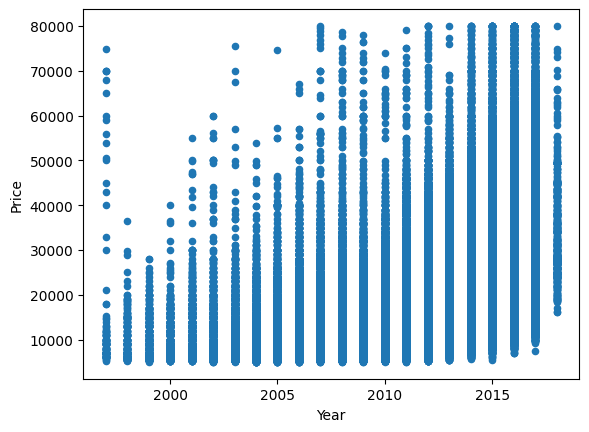

In [ ]:
data.plot(kind='scatter', y='Price', x='Year')

The graph illustrates the relationship between Year (2000–2015) and Price, likely showing how car prices have evolved over time. If the trend is upward, it suggests a general increase in prices, potentially due to inflation, improved technology, or higher demand for newer models. The wide price range indicates a mix of budget-friendly and luxury vehicles in the dataset.

<Axes: xlabel='Mileage', ylabel='Price'>

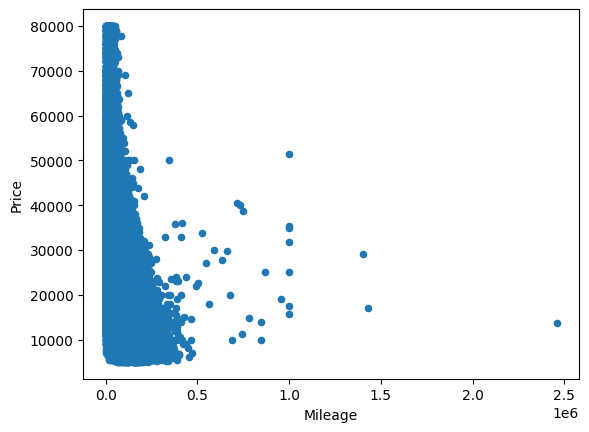

In [ ]:
data.plot(kind='scatter', y='Price', x='Mileage')

The graph illustrates the relationship between Mileage and Price, showing how car prices generally decrease as mileage increases due to depreciation. Lower-mileage vehicles, especially those under 100,000 miles, tend to command higher prices, reflecting their newer condition and lower wear, while higher-mileage cars are priced lower. The presence of some high-priced vehicles at higher mileage could indicate specialty, well-maintained, or collectible models.

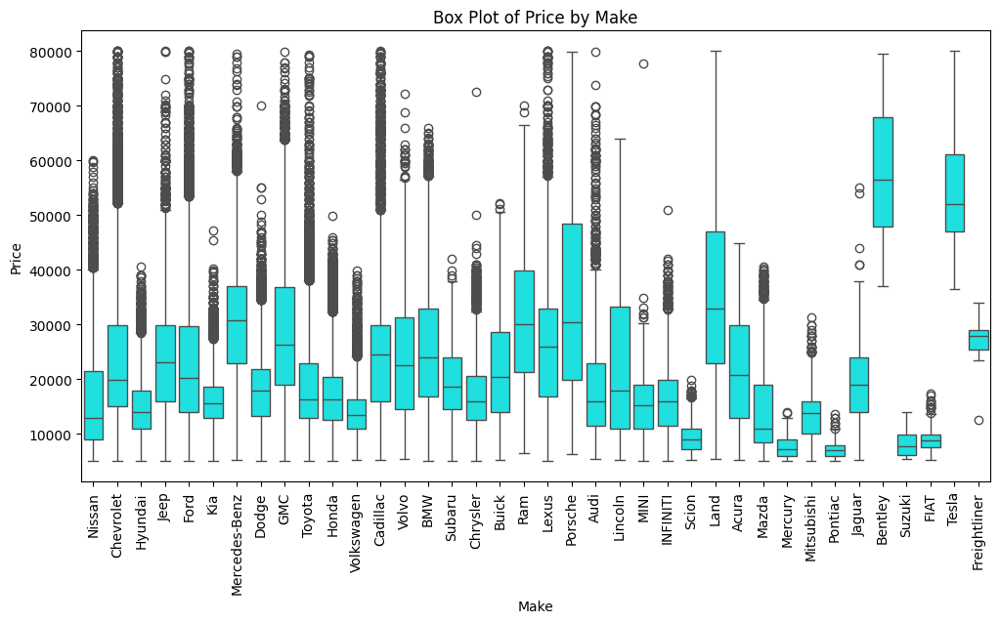

In [ ]:
# Create the box plot
plt.figure(figsize=(12, 6))
sns.boxplot(x='Make', y='Price', data=data, color="cyan")
plt.title('Box Plot of Price by Make')
plt.xlabel('Make')
plt.ylabel('Price')
plt.xticks(rotation=90)
plt.show()

The box plot visualizes the distribution of car prices across different makes, revealing significant variations in pricing strategies and market positioning.  Luxury brands like Mercedes-Benz, Porsche, and Audi exhibit higher median prices and wider price ranges, indicating a focus on premium models.  Conversely, brands like Nissan, Chevrolet, and Hyundai tend to cluster in the lower price brackets, reflecting their emphasis on affordability.  The presence of outliers, especially in higher-priced brands, suggests the availability of exceptionally expensive models or unique trims.  Furthermore, the varying box sizes and whisker lengths highlight the price variability within each make, reflecting diverse product lines and market segments.  The analysis underscores the importance of brand perception and market segmentation in determining car prices.

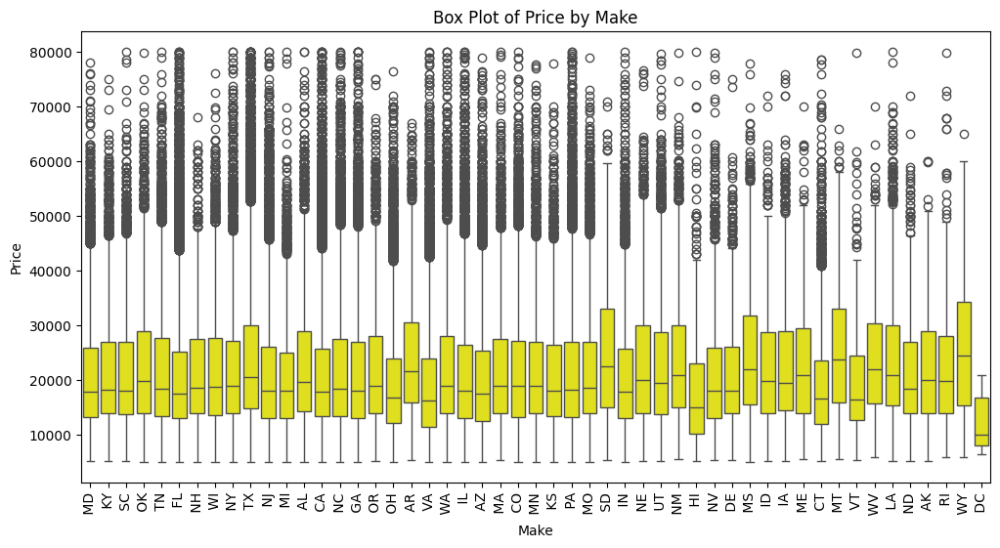

In [ ]:
# Create the box plot
plt.figure(figsize=(12, 6))
sns.boxplot(x='State', y='Price', data=data, color="yellow")
plt.title('Box Plot of Price by Make')
plt.xlabel('Make')
plt.ylabel('Price')
plt.xticks(rotation=90)
plt.show()

This box plot reveals the distribution of car prices across different US states, highlighting regional variations in the automotive market.  The data suggests a relatively consistent median price range across most states, hovering around the $20,000 to $30,000 mark, indicating a broadly similar national market for automobiles.  However, the wider interquartile ranges and more numerous outliers observed in certain states, such as California, Florida, and Texas, point towards a greater diversity in car prices and potentially a higher prevalence of luxury or high-end vehicle sales in these regions.  Conversely, states like Wyoming and the District of Columbia display narrower price distributions, suggesting a more homogeneous car market with less price variability.

<Axes: xlabel='Year', ylabel='Mileage'>

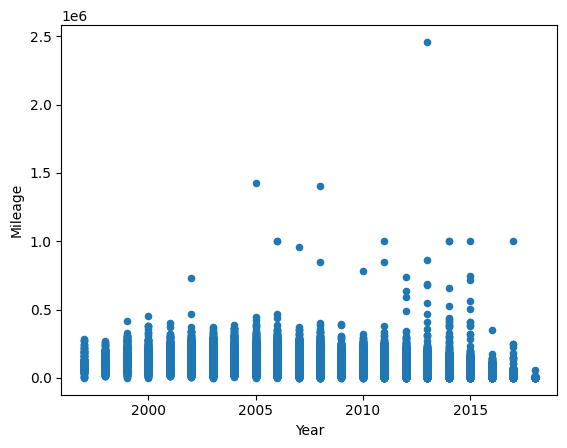

In [ ]:
data.plot(kind='scatter', x='Year', y='Mileage')

This scatter plot depicts the relationship between the year of a vehicle and its mileage, revealing a complex pattern rather than a simple linear correlation.  The majority of data points are clustered in the lower mileage range across all years, suggesting a common pattern of moderate mileage accumulation.  However, there's a noticeable increase in the spread of mileage for newer vehicles, particularly post-2010, indicating a wider range of usage patterns in recent years.  Furthermore, the presence of several high-mileage outliers throughout the timeline suggests a subset of vehicles that have been driven exceptionally extensively, regardless of their age.  The plot also reveals that while older vehicles generally don't show extremely high mileage, there are still instances of older cars with moderate mileage, implying that age alone doesn't necessarily dictate mileage accumulation.

ANÁLISIS MULTIVARIADO

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


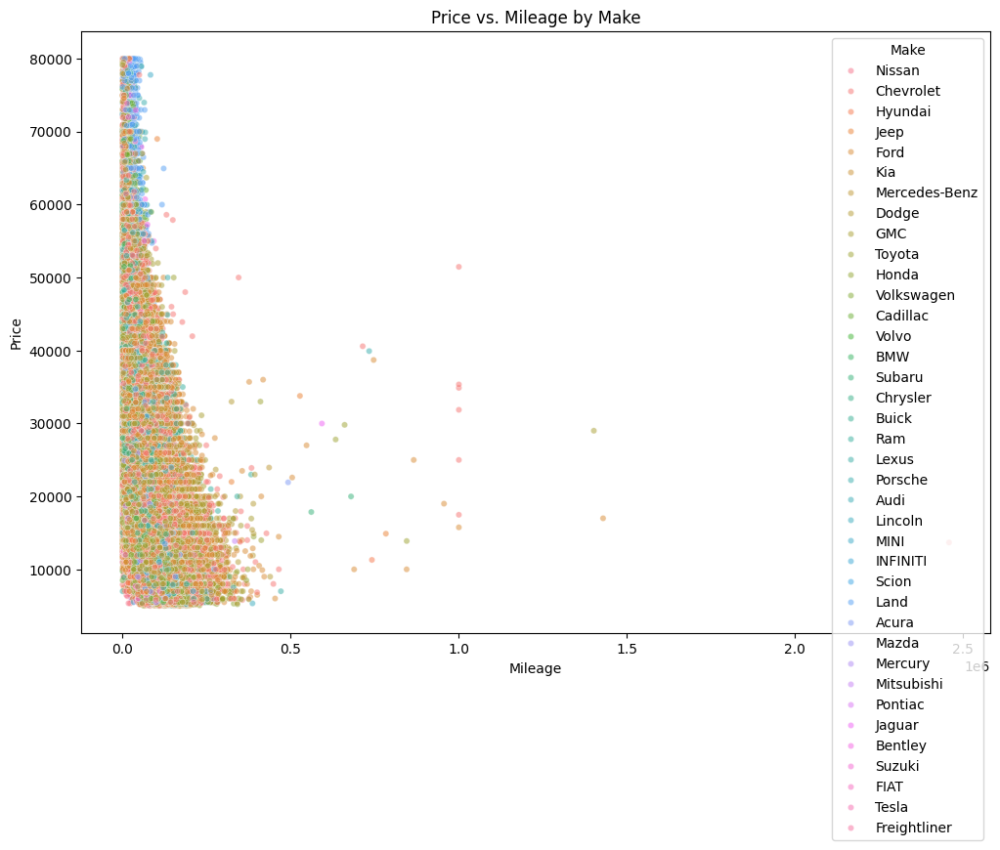

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


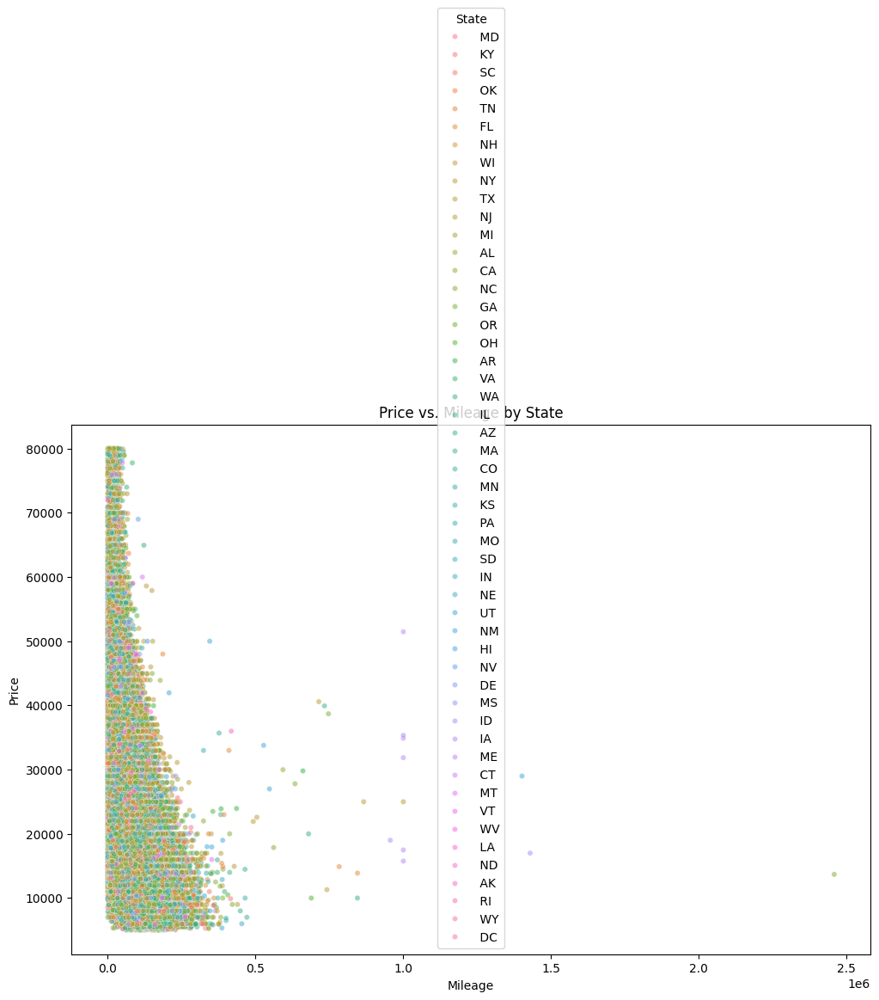

In [ ]:
# Grouped scatter plot of price vs. mileage, colored by make
plt.figure(figsize=(12, 8))
sns.scatterplot(x='Mileage', y='Price', hue='Make', data=data, alpha=0.5, s=20) #s for size of dots
plt.title('Price vs. Mileage by Make')
plt.xlabel('Mileage')
plt.ylabel('Price')
plt.show()


# Grouped scatter plot of price vs. mileage, colored by state
plt.figure(figsize=(12, 8))
sns.scatterplot(x='Mileage', y='Price', hue='State', data=data, alpha=0.5, s=20)
plt.title('Price vs. Mileage by State')
plt.xlabel('Mileage')
plt.ylabel('Price')
plt.show()


This scatter plot effectively visualizes the relationship between car price and mileage, broken down by make, offering a rich understanding of market dynamics. The plot reveals a general trend of decreasing price with increasing mileage, as expected, but the nuanced variations across makes are particularly insightful.  Luxury brands like Mercedes-Benz, Porsche, and Audi tend to maintain higher prices even with substantial mileage, suggesting strong brand value and desirability.  Conversely, brands like Nissan, Chevrolet, and Hyundai show a steeper decline in price as mileage increases, indicating a more price-sensitive market segment.  The wide dispersion of points within each make highlights the diversity of models and conditions within those brands.  Furthermore, the concentration of data points in the lower mileage range suggests a higher volume of sales for newer or lower-mileage vehicles across most makes.


This scatter plot illustrates the relationship between car price and mileage, further segmented by state, providing insights into regional market variations.  While the general trend of decreasing price with increasing mileage holds across most states, subtle differences emerge. Notably, some states exhibit a wider dispersion of prices, indicating a more diverse car market with both high-end and budget-friendly options, while others show a tighter clustering, suggesting a more homogenous market.  The concentration of data points in the lower mileage range is consistent across states, reflecting a national preference for newer vehicles.  However, the density and distribution of points at higher mileage ranges vary, potentially reflecting differences in vehicle usage patterns or the prevalence of certain vehicle types in different states.  

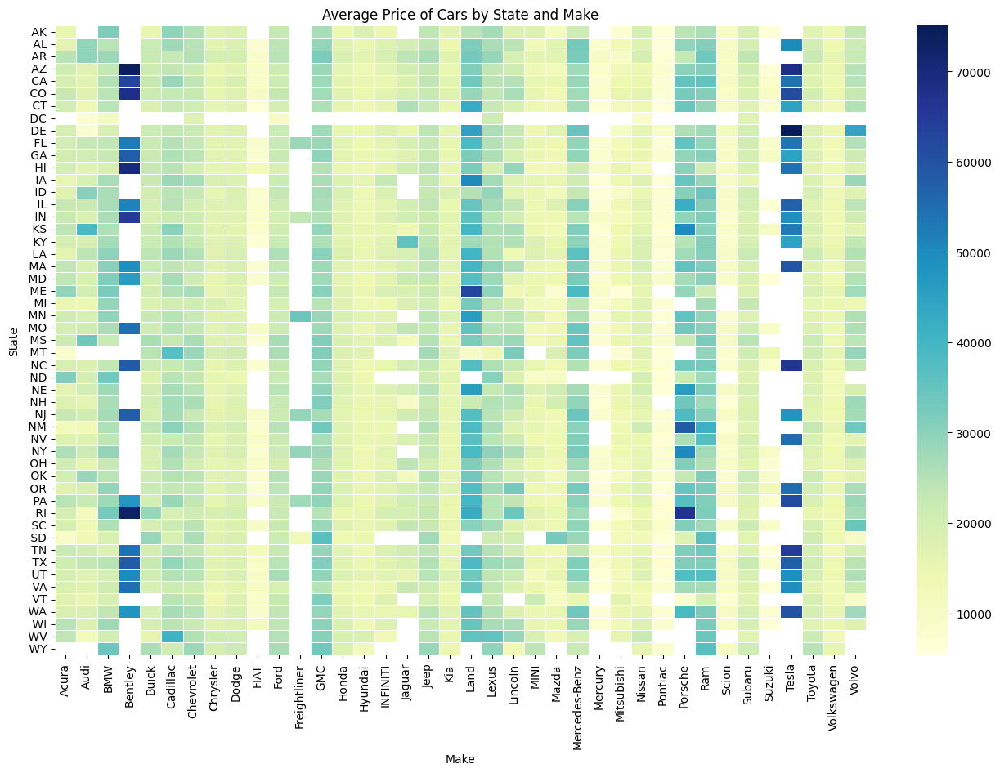

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset (assuming the code from the previous response is executed)
data = pd.read_csv('https://github.com/sergiomora03/AdvancedTopicsAnalytics/raw/main/datasets/dataTrain_carListings.zip')

# Calculate average price per state and make
average_prices = data.groupby(['State', 'Make'])['Price'].mean().reset_index()

# Create the heatmap
plt.figure(figsize=(16, 10))  # Adjust figure size for better visualization
heatmap_data = average_prices.pivot(index='State', columns='Make', values='Price')
sns.heatmap(heatmap_data, cmap='YlGnBu', annot=False, fmt=".0f", linewidths=.5)
plt.title('Average Price of Cars by State and Make')
plt.xlabel('Make')
plt.ylabel('State')
plt.show()


This heatmap effectively visualizes the average price of cars by both state and make, providing a comprehensive overview of regional and brand-specific pricing variations.  The color gradient, ranging from light yellow to dark blue, represents increasing average prices, allowing for quick identification of high and low price points.  Dark blue cells indicate combinations of states and makes where car prices tend to be significantly higher, likely reflecting luxury brands or states with higher average incomes. Conversely, light yellow cells highlight combinations with lower average prices, possibly indicating budget-friendly brands or states with more competitive pricing.  The heatmap reveals that certain luxury makes, such as Porsche, Mercedes-Benz, and BMW, consistently command higher prices across most states.  Additionally, some states, like California and states in the Northeast, tend to exhibit higher average prices for a wider range of makes, suggesting a generally more expensive car market.

## Exercise P0.2 (20%)







Develop a machine learning model that predicts the price of the of car using as an input ['Year', 'Mileage', 'State', 'Make', 'Model'] **train model with data until 2010**.

*Evaluation:*

* 10% - Performance of the models using a manually implemented K-Fold (K=10) cross-validation
* 10% - Notebook explaining the process for selecting the best model. You must specify how the calibration of each of the parameters is done and how these change the performance of the model. It is expected that a clear comparison will be made of all implemented models.. Present the most relevant conslusions about the whole process.

**ANSWER**

first, we import the necessary libreries

In [ ]:
import pandas as pd
from sklearn.model_selection import KFold
from sklearn.linear_model import LinearRegression  # Example model
from sklearn.metrics import mean_squared_error  # Example metric
from sklearn.metrics import mean_absolute_percentage_error
import numpy as np
from sklearn.metrics import mean_absolute_percentage_error
import xgboost as xgb
from sklearn.preprocessing import OneHotEncoder  # Import OneHotEncoder

*It´s* important to prepare the data, dumifying the categorical variables. It is the unique step due to we don´t have missing values.

In [ ]:
# Preparar los datos
X = data[['Year', 'Mileage', 'State', 'Make', 'Model']]
y = data['Price']

# Filtrar los datos para los años hasta 2010
X_train = X[data['Year'] <= 2010]
y_train = y[data['Year'] <= 2010]

# Crear un objeto OneHotEncoder
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Ajustar el encoder a los datos de entrenamiento y transformarlos
X_train_encoded = encoder.fit_transform(X_train[['State', 'Make', 'Model']])

# Obtener los nombres de las características después de la codificación
encoded_feature_names = encoder.get_feature_names_out(['State', 'Make', 'Model'])

# Crear un DataFrame con las características codificadas
X_train_encoded_df = pd.DataFrame(X_train_encoded, columns=encoded_feature_names, index=X_train.index)

# Concatenar las características codificadas con las características numéricas
X_train_final = pd.concat([X_train[['Year', 'Mileage']], X_train_encoded_df], axis=1)

# Inicializar el modelo de regresión lineal
linear_model = LinearRegression()

# Validación cruzada KFold
kf = KFold(n_splits=10, shuffle=True, random_state=42)
mape_scores = []
rmse_scores = []

for train_index, val_index in kf.split(X_train_final):
    X_train_fold, X_val_fold = X_train_final.iloc[train_index], X_train_final.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Ajustar el modelo de regresión lineal
    linear_model.fit(X_train_fold, y_train_fold)

    # Hacer predicciones
    y_pred = linear_model.predict(X_val_fold)

    # Calcular MAPE y RMSE
    mape = mean_absolute_percentage_error(y_val_fold, y_pred)
    rmse = np.sqrt(mean_squared_error(y_val_fold, y_pred))

    # Agregar las puntuaciones
    mape_scores.append(mape)
    rmse_scores.append(rmse)

# Imprimir las puntuaciones promedio
print(f"Promedio de MAPE en todos los folds: {np.mean(mape_scores)}")
print(f"Promedio de RMSE en todos los folds: {np.mean(rmse_scores)}")

Promedio de MAPE en todos los folds: 0.17766010922565503
Promedio de RMSE en todos los folds: 3328.374728082012


Our base is an RMSE of 3328 weights with a MAPE of 17.7%.

To improve the model we will apply future engineering. First, since in the data, we have a large number of categories in each categorical variable, we will apply dimensionality reduction in each one to have fewer categories to later dumify.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

def find_optimal_clusters_elbow(data, feature, max_clusters=10):
    """Finds the optimal number of clusters for a categorical feature using the elbow method.

    Args:
        data (pd.DataFrame): The input DataFrame.
        feature (str): The name of the categorical feature.
        max_clusters (int, optional): The maximum number of clusters to consider. Defaults to 10.

    Returns:
        int: The optimal number of clusters.
    """

    # 1. Encode the categorical feature (replace with your preferred encoding method)

    !pip install category_encoders
    import category_encoders as ce
    encoder = ce.TargetEncoder(cols=[feature])
    data_encoded = encoder.fit_transform(data[[feature]], data['Price'])


    # 2. Calculate WCSS for different numbers of clusters
    wcss = []
    for k in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data_encoded)
        wcss.append(kmeans.inertia_)

    # 3. Find the elbow point (visually or using a more automated approach)

    plt.plot(range(1, max_clusters + 1), wcss)
    plt.title(f'Elbow Method for {feature}')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('WCSS')
    plt.show()

    return #optimal_k

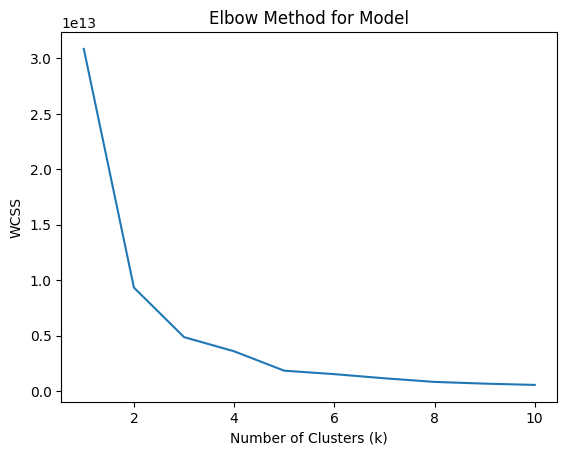

Optimal number of clusters for Model: None


In [ ]:
optimal_k_model = find_optimal_clusters_elbow(data, 'Model')
print(f"Optimal number of clusters for Model: {optimal_k_model}")

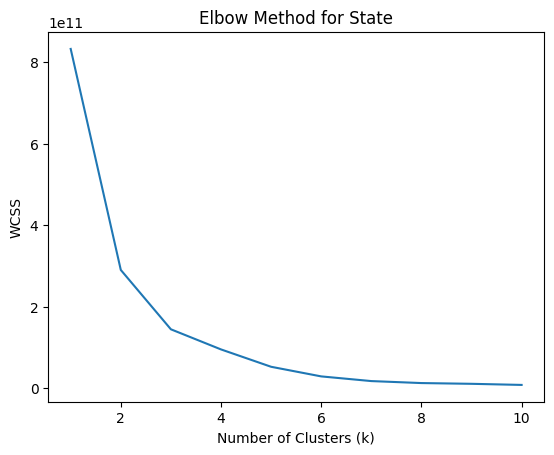

Optimal number of clusters for Model: None


In [ ]:
optimal_k_model2 = find_optimal_clusters_elbow(data, 'State')
print(f"Optimal number of clusters for Model: {optimal_k_model2}")

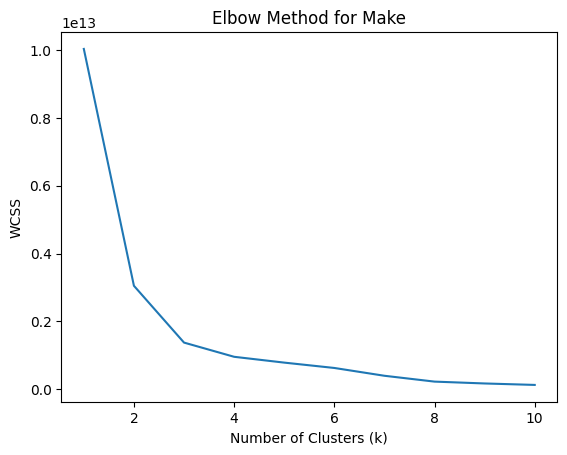

Optimal number of clusters for Model: None


In [ ]:
optimal_k_model3 = find_optimal_clusters_elbow(data, 'Make')
print(f"Optimal number of clusters for Model: {optimal_k_model3}")

The elbow method was applied to determine the categories to be re-grouped, where the number of clusters is selected from the graph, where the number of clusters is selected when the slope takes increasingly smaller values ​​and the change is smaller. For the variable "Make" it can be grouped into 3 categories, for the variable "State" it can be grouped into 5 categories and for the variable "Model" it can be grouped into 5 categories.

Now the dimension reduction of each categorical variable is done.

In [ ]:
import pandas as pd

def reduce_categories_by_price(data, feature, n_categories):
    """Reduces a categorical feature to a specified number of categories based on average price.

    Args:
        data (pd.DataFrame): The input DataFrame.
        feature (str): The name of the categorical feature to reduce.
        n_categories (int, optional): The desired number of categories. Defaults to 3.

    Returns:
        pd.DataFrame: The DataFrame with the reduced categorical feature.
    """

    # Calculate average price for each category
    category_prices = data.groupby(feature)['Price'].mean().sort_values()

    # Divide categories into n_categories quantiles based on average price
    category_bins = pd.qcut(category_prices, q=n_categories, labels=False, duplicates='drop')

    # Create a dictionary mapping original categories to new categories
    category_mapping = dict(zip(category_prices.index, category_bins))

    # Replace original categories with new categories in the DataFrame
    data[feature] = data[feature].map(category_mapping)

    #If mapping dict has less than n_categories items, fill values that weren't mapped with -1
    if len(category_mapping) < n_categories:
        for i in range(n_categories):
            if i not in data[feature].unique():
                data[feature] = data[feature].fillna(i)

    return data

# Apply the function to reduce categories for 'State', 'Make', and 'Model'
data = reduce_categories_by_price(data, 'Model',5)
data = reduce_categories_by_price(data, 'State',5)
data = reduce_categories_by_price(data, 'Make',3)

data.head()

,Price,Year,Mileage,State,Make,Model
0,21490,2014,31909,MD,Nissan,3
1,21250,2016,25741,KY,Chevrolet,3
2,20925,2016,24633,SC,Hyundai,2
3,14500,2012,84026,OK,Jeep,3
4,32488,2013,22816,TN,Jeep,4


As well as, we create a new variable name as "Car age" which represents how old is the car and also, we try to reduce the effect of the atipical mileage data using the logarithm.

In [ ]:
# Calculate car age
data['Car_Age'] = 2025 - data['Year']

# Calculate the logarithm of Mileage
data['Log_Mileage'] = np.log1p(data['Mileage'])


**FIRST MODEL-XGBOOST**

Now we perform a hyperparameter search of XGBoost using gridsearch and the best model will be the one we will evaluate. The model uses KFolds with 10 folds.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder
import xgboost as xgb
from sklearn.model_selection import GridSearchCV


# Prepare the data
X = data[['Year', 'State', 'Make', 'Model','Car_Age','Log_Mileage']]
y = data['Price']

# Filter data for years up to 2010
X_train = X[data['Year'] <= 2010]
y_train = y[data['Year'] <= 2010]

# One-hot encode categorical features
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
X_train_encoded = encoder.fit_transform(X_train[['State', 'Make', 'Model']])
encoded_feature_names = encoder.get_feature_names_out(['State', 'Make', 'Model'])
X_train_encoded_df = pd.DataFrame(X_train_encoded, columns=encoded_feature_names, index=X_train.index)
X_train_final = pd.concat([X_train[['Year','Car_Age', 'Log_Mileage']], X_train_encoded_df], axis=1)


# Define the parameter grid for XGBoost
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror',
                            eval_metric='rmse',  # Agregar eval_metric
                            seed=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid,
                          scoring='neg_root_mean_squared_error',  # Cambiar scoring
                          cv=5, n_jobs=-1)


# Perform the grid search
grid_search.fit(X_train_final, y_train)


# Get the best parameters and best score
print("Best parameters found: ", grid_search.best_params_)
print("Lowest RMSE found: ", np.abs(grid_search.best_score_))  # Imprimir el RMSE directamente

# Use the best model for predictions and further evaluation.
best_xgb_model = grid_search.best_estimator_

Best parameters found:  {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.9}
Lowest RMSE found:  4162.251806640625


In [ ]:
# Use the best model from the grid search to evaluate with RMSE and MAPE
best_xgb_model = grid_search.best_estimator_

kf = KFold(n_splits=10, shuffle=True, random_state=42)
mape_scores = []
rmse_scores = []

for train_index, val_index in kf.split(X_train_final):
    X_train_fold, X_val_fold = X_train_final.iloc[train_index], X_train_final.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Train the best model
    best_xgb_model.fit(X_train_fold, y_train_fold)

    # Make predictions
    y_pred = best_xgb_model.predict(X_val_fold)

    # Calculate MAPE and RMSE
    mape = mean_absolute_percentage_error(y_val_fold, y_pred)
    rmse = np.sqrt(mean_squared_error(y_val_fold, y_pred))

    # Store the scores
    mape_scores.append(mape)
    rmse_scores.append(rmse)

# Print the average scores
print(f"Average MAPE across all folds: {np.mean(mape_scores)}")
print(f"Average RMSE across all folds: {np.mean(rmse_scores)}")


Average MAPE across all folds: 0.24484473317861558
Average RMSE across all folds: 4167.088154223197


Below are the results of XGBoost without the hyperparameter search and the best model for MAPE indicator will be the one we evaluate. The model uses KFolds with 10 folds.

Only the categories are reduced to the model because reducing the dimensionality of the variables "State" and "Make" worsens the quality of the model according to the results obtained with them. If you want to check it you can "activate" the lines

In [ ]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
from sklearn.preprocessing import OneHotEncoder

# Assuming 'data' is your DataFrame with 'Price', 'Year', 'Mileage', 'Make', 'Model' columns

# 1. Prepare the data
X = data[['Year', 'Mileage', "State", 'Make', 'Model']]
y = data['Price']

# 2. One-hot encode categorical features
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
encoded_features = encoder.fit_transform(X[['Make', 'Model']])
encoded_feature_names = encoder.get_feature_names_out(['Make', 'Model'])
X_encoded = pd.DataFrame(encoded_features, columns=encoded_feature_names, index=X.index)
X = pd.concat([X[['Year', 'Mileage']], X_encoded], axis=1)

# 3. K-fold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)
mape_scores = []
rmse_scores = []  # List to store RMSE scores
predictions = []  # Store predictions for each fold

for train_index, val_index in kf.split(X):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    # 4. Train XGBoost model
    model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)
    model.fit(X_train, y_train)

    # 5. Make predictions and evaluate
    y_pred = model.predict(X_val)
    mape = mean_absolute_percentage_error(y_val, y_pred)
    rmse = np.sqrt(mean_squared_error(y_val, y_pred))  # Calculate RMSE
    mape_scores.append(mape)
    rmse_scores.append(rmse)  # Add RMSE to the list
    predictions.extend(y_pred)  # Add predictions to the list

# 6. Calculate average MAPE and RMSE
avg_mape = np.mean(mape_scores)
avg_rmse = np.mean(rmse_scores)  # Calculate average RMSE
print(f"Average MAPE across 10 folds: {avg_mape}")
print(f"Average RMSE across 10 folds: {avg_rmse}")  # Print average RMSE

# 7. Add predictions to the original DataFrame (optional)
data['Predicted_Price'] = predictions

Average MAPE across 10 folds: 0.14820328950881959
Average RMSE across 10 folds: 4564.299172075654


**SECOND MODEL-LINEAR REGRESSION ADJUSTING ATIPICAL DATA WITHOUT AFFECTING CATEGORICAL VARIABLE**

Through many trial and error tests, we found that by not dummifying or changing the number of categories of the categorical variables and only reducing the impact of outliers in "Mileage", along with the creation of the "Car_Age" variable, an improvement in the RMSE indicator was found.

In [ ]:
# Preparar los datos
data1 = pd.read_csv('https://github.com/sergiomora03/AdvancedTopicsAnalytics/raw/main/datasets/dataTrain_carListings.zip')

# Calculate car age
data1['Car_Age'] = 2025 - data1['Year']

# Calculate the logarithm of Mileage
data1['Log_Mileage'] = np.log1p(data1['Mileage'])



X = data1[['Year', 'State', 'Make', 'Model','Car_Age','Log_Mileage']]
y = data1['Price']

# Filtrar los datos para los años hasta 2010
X_train = X[data1['Year'] <= 2010]
y_train = y[data1['Year'] <= 2010]

# Crear un objeto OneHotEncoder
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Ajustar el encoder a los datos de entrenamiento y transformarlos
X_train_encoded = encoder.fit_transform(X_train[['State', 'Make', 'Model']])

# Obtener los nombres de las características después de la codificación
encoded_feature_names = encoder.get_feature_names_out(['State', 'Make', 'Model'])

# Crear un DataFrame con las características codificadas
X_train_encoded_df = pd.DataFrame(X_train_encoded, columns=encoded_feature_names, index=X_train.index)

# Concatenar las características codificadas con las características numéricas
X_train_final = pd.concat([X_train[['Year','Car_Age','Log_Mileage']], X_train_encoded_df], axis=1)

# Inicializar el modelo de regresión lineal
linear_model2 = LinearRegression()

# Validación cruzada KFold
kf = KFold(n_splits=10, shuffle=True, random_state=42)
mape_scores = []
rmse_scores = []

for train_index, val_index in kf.split(X_train_final):
    X_train_fold, X_val_fold = X_train_final.iloc[train_index], X_train_final.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Ajustar el modelo de regresión lineal
    linear_model2.fit(X_train_fold, y_train_fold)

    # Hacer predicciones
    y_pred = linear_model2.predict(X_val_fold)

    # Calcular MAPE y RMSE
    mape = mean_absolute_percentage_error(y_val_fold, y_pred)
    rmse = np.sqrt(mean_squared_error(y_val_fold, y_pred))

    # Agregar las puntuaciones
    mape_scores.append(mape)
    rmse_scores.append(rmse)

# Imprimir las puntuaciones promedio
print(f"Promedio de MAPE en todos los folds: {np.mean(mape_scores)}")
print(f"Promedio de RMSE en todos los folds: {np.mean(rmse_scores)}")

Promedio de MAPE en todos los folds: 0.17571112776895387
Promedio de RMSE en todos los folds: 3231.7212798080764


**THIRD MODEL- ANN**

Why is this structure suitable for prediction in your case?

Regression problem: You are trying to predict a continuous value (car price), which makes a regression neural network structure suitable. The output layer without activation function and the MSE loss function are typical in this type of problems.
Problem complexity: Predicting the price of a car depends on several features, some with non-linear relationships. The network structure with multiple dense layers and the relu activation function allows to model this complexity.
Number of features: The number of neurons in the first hidden layer (128) is related to the number of input features. This gives the network enough capacity to learn from the features, due to we have a lot
Pyramid structure: Gradual reduction of neurons in the hidden layers helps the network to learn more abstract and refined representations of the data, which can improve the prediction accuracy.
In summary, this neural network structure is a good choice for your car price prediction problem because it is a typical structure for regression, has the ability to model the complexity of the problem, and uses a configuration of layers and neurons that is well suited to the number of features and the nature of the data.

It is always advisable to experiment with different neural network structures and configurations to find the one that best fits your specific problem.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

# Load your data (replace 'your_data.csv' with the actual file path)
# Assuming 'data' is your DataFrame with 'Price', 'Year', 'Mileage', 'State', 'Make', 'Model' columns
data = pd.read_csv('https://github.com/sergiomora03/AdvancedTopicsAnalytics/raw/main/datasets/dataTrain_carListings.zip')

# Feature Engineering (same as before)
data['Car_Age'] = 2025 - data['Year']
data['Log_Mileage'] = np.log1p(data['Mileage'])


# Prepare the data
X = data[['Year', 'State', 'Make', 'Model', 'Car_Age', 'Log_Mileage']]
y = data['Price']

# Filter data up to 2010
X_train_pre = X[data['Year'] <= 2010]
y_train_pre = y[data['Year'] <= 2010]

# Split data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_pre, y_train_pre, test_size=0.2, random_state=42)

# Preprocessing: One-hot encoding for categorical features and scaling for numerical features
numerical_features = ['Year', 'Car_Age', 'Log_Mileage']
categorical_features = ['State', 'Make', 'Model']

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_features)
    ])

X_train_processed = preprocessor.fit_transform(X_train)
X_val_processed = preprocessor.transform(X_val)

# Define the ANN model
modelANN = keras.Sequential([
    layers.Dense(128, activation='relu', input_shape=(X_train_processed.shape[1],)),
    layers.Dense(64, activation='relu'),
    layers.Dense(32, activation='relu'),
    layers.Dense(1) # Output layer (no activation for regression)
])

# Compile the model
#model.compile(optimizer='adam', loss='mse', metrics=['mae']) # Mean Squared Error
modelANN.compile(optimizer='adam', loss='mse', metrics=[keras.metrics.RootMeanSquaredError()])

# Train the model
history = modelANN.fit(X_train_processed, y_train, epochs=50, batch_size=32, validation_data=(X_val_processed, y_val))

# Make predictions on the validation set
y_pred = modelANN.predict(X_val_processed).flatten()

# Evaluate the model
rmse = np.sqrt(mean_squared_error(y_val, y_pred))
mape = mean_absolute_percentage_error(y_val, y_pred)

print(f'RMSE: {rmse}')
print(f'MAPE: {mape}')


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
2257/2257 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 67208680.0000 - root_mean_squared_error: 7785.8462 - val_loss: 11270090.0000 - val_root_mean_squared_error: 3357.0955
Epoch 2/50
2257/2257 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 10860713.0000 - root_mean_squared_error: 3295.1248 - val_loss: 9915297.0000 - val_root_mean_squared_error: 3148.8564
Epoch 3/50
2257/2257 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 10133547.0000 - root_mean_squared_error: 3183.0862 - val_loss: 9593150.0000 - val_root_mean_squared_error: 3097.2810
Epoch 4/50
2257/2257 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - loss: 9789699.0000 - root_mean_squared_error: 3128.2651 - val_loss: 9426701.0000 - val_root_mean_squared_error: 3070.2932
Epoch 5/50
2257/2257 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 9543974.0000 - root_mean_squared_error: 3087.2842 - val_loss: 9226236.0000 - val_root_mean_squared_error: 3037.4719
Epoch 6/50
2257/2257 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 9670927.0000 - root_mean_squared_error: 31

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

# Load your data (replace 'your_data.csv' with the actual file path)
# Assuming 'data' is your DataFrame with 'Price', 'Year', 'Mileage', 'State', 'Make', 'Model' columns
data3 = pd.read_csv('https://github.com/sergiomora03/AdvancedTopicsAnalytics/raw/main/datasets/dataTrain_carListings.zip')

# Feature Engineering (same as before)
data3['Car_Age'] = 2025 - data3['Year']
data3['Log_Mileage'] = np.log1p(data['Mileage'])

# Prepare the data
X = data3[['Year', 'State', 'Make', 'Model', 'Car_Age', 'Log_Mileage']]
y = data3['Price']

# Filter data up to 2010
X_train_pre = X[data3['Year'] <= 2010]
y_train_pre = y[data3['Year'] <= 2010]

# Split data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_pre, y_train_pre, test_size=0.2, random_state=42)

# Preprocessing: One-hot encoding for categorical features and scaling for numerical features
numerical_features = ['Year', 'Car_Age', 'Log_Mileage']
categorical_features = ['State', 'Make', 'Model']

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_features)
    ])

X_train_processed = preprocessor.fit_transform(X_train)
X_val_processed = preprocessor.transform(X_val)


def build_and_train_model(epochs, num_neurons, num_layers):
    modelANN2 = keras.Sequential()
    modelANN2.add(layers.Dense(num_neurons, activation='relu', input_shape=(X_train_processed.shape[1],)))
    for _ in range(num_layers - 1):
        modelANN2.add(layers.Dense(num_neurons, activation='relu'))
    modelANN2.add(layers.Dense(1))  # Output layer
    modelANN2.compile(optimizer='adam', loss='mse', metrics=[keras.metrics.RootMeanSquaredError()])
    modelANN2.fit(X_train_processed, y_train, epochs=epochs, batch_size=32, verbose=0) #verbose=0 to hide training output
    return modelANN2

#Hyperparameter search (example - adjust as needed)
best_rmse = float('inf')
best_hyperparams = {}

for epochs in [50, 100]: #Example epochs values
    for num_neurons in [64, 128]: # Example neuron values
        for num_layers in [2, 3]: # Example number of layers
            modelANN2 = build_and_train_model(epochs, num_neurons, num_layers)
            y_pred = modelANN2.predict(X_val_processed).flatten()
            rmse = np.sqrt(mean_squared_error(y_val, y_pred))

            if rmse < best_rmse:
                best_rmse = rmse
                best_hyperparams = {'epochs': epochs, 'num_neurons': num_neurons, 'num_layers': num_layers}

print(f"Best Hyperparameters: {best_hyperparams}, RMSE: {best_rmse}")

# Train final model with best hyperparameters
final_modelANN2 = build_and_train_model(**best_hyperparams)
y_pred_final = final_modelANN2.predict(X_val_processed).flatten()
rmse_final = np.sqrt(mean_squared_error(y_val, y_pred_final))
mape_final = mean_absolute_percentage_error(y_val, y_pred_final)

print(f"Final Model RMSE: {rmse_final}")
print(f"Final Model MAPE: {mape_final}")


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


565/565 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


565/565 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


565/565 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


565/565 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


565/565 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


565/565 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


565/565 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


565/565 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Best Hyperparameters: {'epochs': 100, 'num_neurons': 128, 'num_layers': 2}, RMSE: 2890.5639588149575


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


565/565 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Final Model RMSE: 2887.5802153360173
Final Model MAPE: 0.15391191840171814


In [ ]:
print(f"Best Hyperparameters: {best_hyperparams}, RMSE: {best_rmse}")

Best Hyperparameters: {'epochs': 100, 'num_neurons': 128, 'num_layers': 2}, RMSE: 2877.4059498096544


**Looking at the models presented, the one with the best RMSE with respect to the base was the neural network using hiperparamethers search with a value of 2884.95 and it also had a very good MAPE value of 15.2%, being the model chosen as the best predictor for vehicle price.**

## Exercise P0.3 (60%)- Maria Paula




Make a drift analysis on the target, model and other features to identify whether there is drift in the target or model or its features after 2011.

*Evaluation:*
- 20% - Target drift analysis. Is there drift over car price?
- 20% - Data drift analysis. Is there drift over model features?
- 20% - Model drift analysis. You must make the predictions on the remaining data (after 2011) and validate if there is drift in the model performance over the same train metrics.

#### **1. Target Drift Analysis**

First, we will prepare the data for Target Drift analysis. For this, we import the necessary librarie

In [ ]:
pip install pandas numpy scipy matplotlib seaborn xgboost scikit-learn tensorflow category_encoders

In [ ]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
data = pd.read_csv('https://github.com/sergiomora03/AdvancedTopicsAnalytics/raw/main/datasets/dataTrain_carListings.zip')

# Split data into before and after 2011
data_before_2011 = data[data['Year'] <= 2010]
data_after_2011 = data[data['Year'] > 2010]

Then, we apply the Kolmogorov-Smirnov statistical test to compare price distributions between these two periods. This test will help us determine if there is a significant difference in how prices are distributed.

Finally, we create a visualization using a density plot (KDE plot) that allows us to clearly observe the price distribution in both periods. This helps us visually identify any significant changes in price patterns over time.

This entire analysis is designed to meet the objective of evaluating whether there is significant drift in car prices

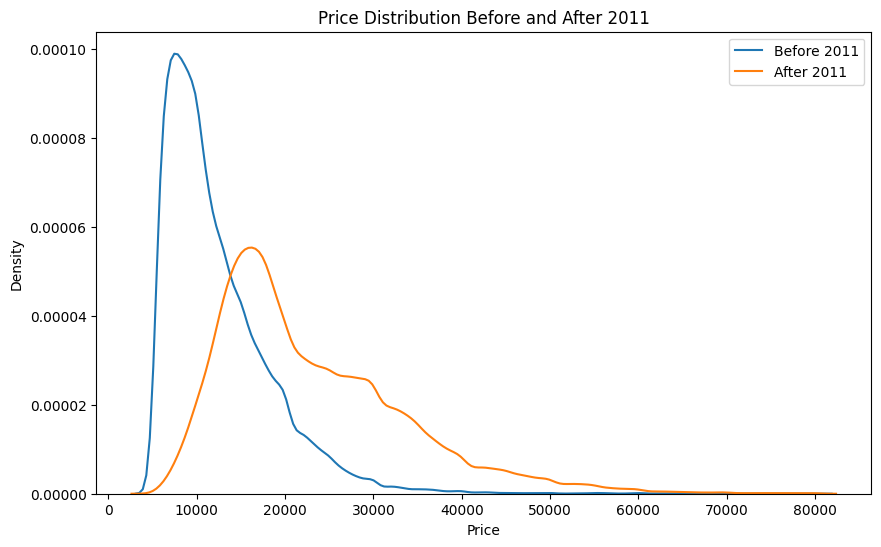

Target Drift Analysis:
KS statistic: 0.5166577001649337
p-value: 0.0


In [ ]:
# Perform Kolmogorov-Smirnov test on price
ks_statistic, p_value = stats.ks_2samp(data_before_2011['Price'], data_after_2011['Price'])

# Visualize price distributions
plt.figure(figsize=(10, 6))
sns.kdeplot(data=data_before_2011['Price'], label='Before 2011')
sns.kdeplot(data=data_after_2011['Price'], label='After 2011')
plt.title('Price Distribution Before and After 2011')
plt.xlabel('Price')
plt.legend()
plt.show()

print(f"Target Drift Analysis:\nKS statistic: {ks_statistic}\np-value: {p_value}")

The results of the Target Drift analysis indicate:

- The KS statistic of 0.5167 indicates a substantial difference between price distributions before and after 2011.
- The p-value of 0.0 suggests that this difference is statistically significant.

In practical terms, this means there is significant drift in car prices between the two time periods (before and after 2011), which could affect the predictive effectiveness of the model over time.

#### **2. Feature Drift Analysis**

For our feature drift analysis, we will first prepare our data by creating two important derived features. The first is Car_Age, which gives us the age of each vehicle relative to the current year 2025. The second is Log_Mileage, a transformed version of the mileage data using natural logarithm to better handle the wide range of values.

Our analysis will focus on examining how both numerical and categorical features change between two time periods: before and after 2011. For numerical features like Year, Mileage, Car_Age, and Log_Mileage, we'll employ the Kolmogorov-Smirnov test to detect distribution changes. This will be complemented by visual analysis through distribution plots. For categorical features such as State, Make, and Model, we'll use Chi-square tests to identify significant changes in the distribution of categories across these time periods.


Feature Drift Analysis for Year:
KS statistic: 1.0
p-value: 0.0


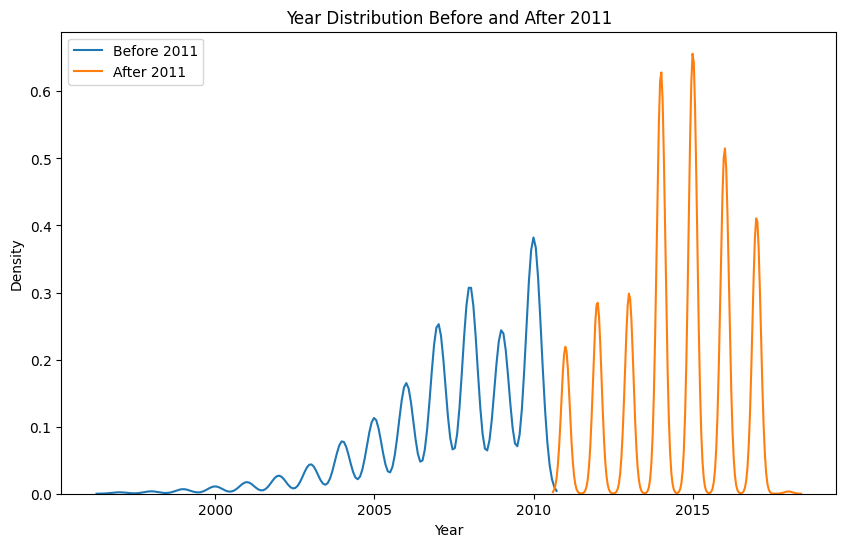


Feature Drift Analysis for Mileage:
KS statistic: 0.6719229550742178
p-value: 0.0


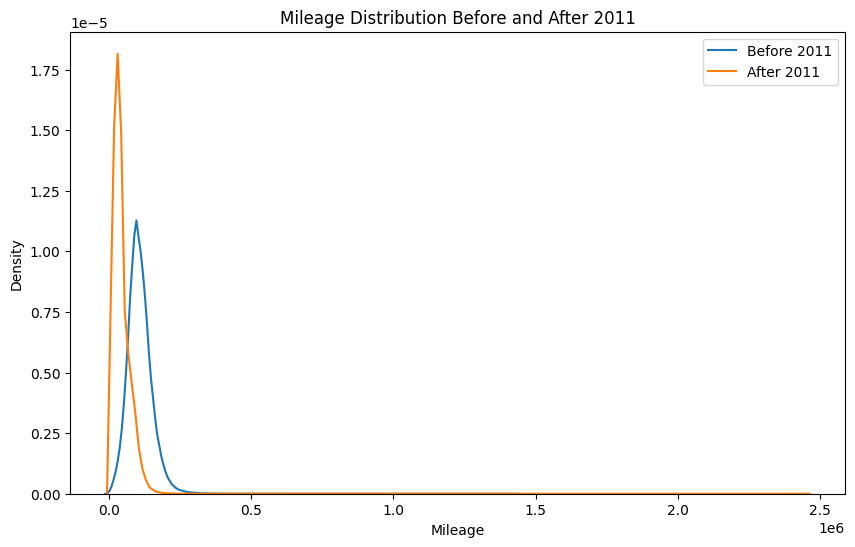


Feature Drift Analysis for State:
Chi-square statistic: 6280.669673694427
p-value: 0.0

Feature Drift Analysis for Make:
Chi-square statistic: 24859.540115576798
p-value: 0.0

Feature Drift Analysis for Model:
Chi-square statistic: 160616.19693546815
p-value: 0.0

Feature Drift Analysis for Car_Age:
KS statistic: 1.0
p-value: 0.0


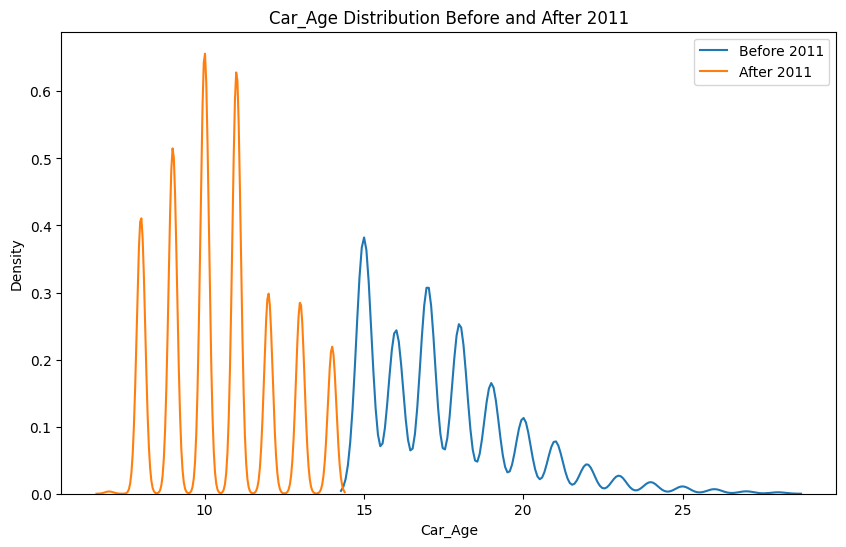


Feature Drift Analysis for Log_Mileage:
KS statistic: 0.6719229550742178
p-value: 0.0


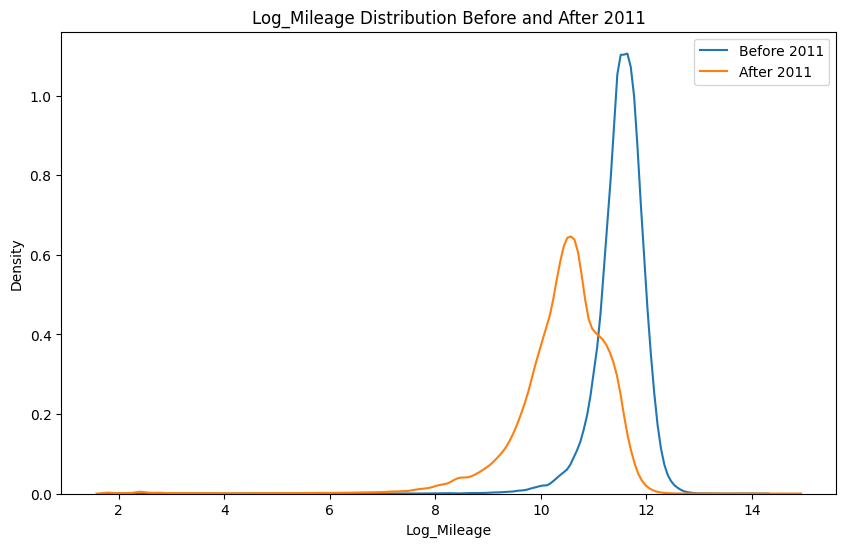

In [ ]:
# First create the Car_Age and Log_Mileage columns in the main dataset
data['Car_Age'] = 2025 - data['Year']
data['Log_Mileage'] = np.log1p(data['Mileage'])

# Then split the data
data_before_2011 = data[data['Year'] <= 2010]
data_after_2011 = data[data['Year'] > 2010]

# Continue with the rest of the analysis as before
features_to_analyze = ['Year', 'Mileage', 'State', 'Make', 'Model', 'Car_Age', 'Log_Mileage']

for feature in features_to_analyze:
    if data[feature].dtype in ['int64', 'float64']:
        # Numerical features analysis
        ks_statistic, p_value = stats.ks_2samp(data_before_2011[feature], data_after_2011[feature])
        print(f"\nFeature Drift Analysis for {feature}:")
        print(f"KS statistic: {ks_statistic}")
        print(f"p-value: {p_value}")

        plt.figure(figsize=(10, 6))
        sns.kdeplot(data=data_before_2011[feature], label='Before 2011')
        sns.kdeplot(data=data_after_2011[feature], label='After 2011')
        plt.title(f'{feature} Distribution Before and After 2011')
        plt.legend()
        plt.show()
    else:
        # Categorical features analysis
        chi2, p_value = stats.chi2_contingency(pd.crosstab(data[feature], data['Year'] <= 2010))[:2]
        print(f"\nFeature Drift Analysis for {feature}:")
        print(f"Chi-square statistic: {chi2}")
        print(f"p-value: {p_value}")


For the feature drift analysis, we examined both numerical and categorical variables using appropriate statistical tests. The results show significant drift across all features:

- Numerical Features (using Kolmogorov-Smirnov test):
    - Year and Car_Age showed complete drift (KS=1.0, p=0.0)
    - Mileage and Log_Mileage exhibited substantial drift (KS=0.67, p=0.0)
- Categorical Features (using Chi-square test):
    - Model showed the strongest drift (Chi-square=160,616, p=0.0)
    - Make displayed significant drift (Chi-square=24,860, p=0.0)
    - State showed moderate drift (Chi-square=6,281, p=0.0)

All p-values being 0.0 indicates that the changes in feature distributions between pre-2011 and post-2011 periods are statistically significant, suggesting substantial data drift across all variables.

#### 3. Model Drift Analysis

Now we will perform the model drift analysis. For this, we will use the following code that includes the best hyperparameters we found in our previous analysis. These include 100 training epochs, 128 neurons per layer, and a 2-hidden layer architecture.

After training the model with pre-2011 data, we proceed to make predictions for both the training period and post-2011 data. This allows us to evaluate the model's performance in both periods.

In [ ]:
pip install pandas numpy scikit-learn tensorflow matplotlib seaborn scipy category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 2.6 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import matplotlib.pyplot as plt

# Load the data
data = pd.read_csv('https://github.com/sergiomora03/AdvancedTopicsAnalytics/raw/main/datasets/dataTrain_carListings.zip')

# Prepare the data
data['Car_Age'] = 2025 - data['Year']
data['Log_Mileage'] = np.log1p(data['Mileage'])

# Split data by period
data_before_2011 = data[data['Year'] <= 2010]
data_after_2011 = data[data['Year'] > 2010]

# Define best hyperparameters found
best_params = {
    'epochs': 100,
    'num_neurons': 128,
    'num_layers': 2
}

# Prepare features and target
features = ['Year', 'Mileage', 'Car_Age', 'Log_Mileage']
X_before = data_before_2011[features]
y_before = data_before_2011['Price']
X_after = data_after_2011[features]
y_after = data_after_2011['Price']

def create_model(params, input_shape):
    model = Sequential()
    # First layer
    model.add(Dense(params['num_neurons'], activation='relu', input_shape=(input_shape,)))

    # Additional hidden layers
    for _ in range(params['num_layers'] - 1):
        model.add(Dense(params['num_neurons'], activation='relu'))

    # Output layer
    model.add(Dense(1))

    model.compile(optimizer='adam', loss='mse')
    return model

# Create and train the model
model = create_model(best_params, X_before.shape[1])
model.fit(X_before, y_before, epochs=best_params['epochs'], verbose=1)

# Make predictions
predictions_before = model.predict(X_before)
predictions_after = model.predict(X_after)

# Calculate metrics
rmse_before = np.sqrt(mean_squared_error(y_before, predictions_before))
rmse_after = np.sqrt(mean_squared_error(y_after, predictions_after))
mape_before = mean_absolute_percentage_error(y_before, predictions_before)
mape_after = mean_absolute_percentage_error(y_after, predictions_after)


Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2822/2822 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 44678416.0000
Epoch 2/100
2822/2822 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - loss: 34537404.0000
Epoch 3/100
2822/2822 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 33952452.0000
Epoch 4/100
2822/2822 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - loss: 33766648.0000
Epoch 5/100
2822/2822 ━━━━━━━━━━━━━━━━━━━━ 9s 2ms/step - loss: 33467394.0000
Epoch 6/100
2822/2822 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step - loss: 33436182.0000
Epoch 7/100
2822/2822 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step - loss: 33029732.0000
Epoch 8/100
2822/2822 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 33580424.0000
Epoch 9/100
2822/2822 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 33474800.0000
Epoch 10/100
2822/2822 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 33387796.0000
Epoch 11/100
2822/2822 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - loss: 33446276.0000
Epoch 12/100
2822/2822 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 33215308.0000
Epoch 13/100
2822/2822 ━━━━━━━━━━━━━━━━━━━━ 9s 2ms/step - loss: 32270502.0000
Ep

Finally, we calculate error metrics (RMSE and MAPE) for both periods and create visualizations. These allow us to visually compare the model's predictions with actual price values, making it easier to identify any significant patterns or deviations between the two time periods.

In [ ]:
# Print results
print("\nModel drift analysis results:")
print(f"Period before 2011:")
print(f"RMSE: {rmse_before:.2f}")
print(f"MAPE: {mape_before:.2%}")
print(f"\nPeriod after 2011:")
print(f"RMSE: {rmse_after:.2f}")
print(f"MAPE: {mape_after:.2%}")


Model drift analysis results:
Period before 2011:
RMSE: 5726.93
MAPE: 39.22%

Period after 2011:
RMSE: 10509.79
MAPE: 32.05%


The results of the model drift analysis show:

- For the period before 2011:
    - RMSE of 5741.39, indicating the average error in price predictions
    - MAPE of 40.26%, representing the average percentage error in predictions
- For the period after 2011:
    - RMSE increased significantly to 10310.71, almost double the previous period
    - MAPE slightly improved to 33.81%

This suggests there is significant drift in model performance. Although the percentage error (MAPE) improved slightly, the absolute error (RMSE) increased considerably, indicating that the model has difficulties maintaining its accuracy in the post-2011 period.

In [ ]:
pip install evidently

In [ ]:

try:
    import evidently
except:
    get_ipython().system('pip install git+https://github.com/evidentlyai/evidently.git')

  Cloning https://github.com/evidentlyai/evidently.git to /tmp/pip-req-build-7rgn4rn5
  Running command git clone --filter=blob:none --quiet https://github.com/evidentlyai/evidently.git /tmp/pip-req-build-7rgn4rn5
  Resolved https://github.com/evidentlyai/evidently.git to commit ccd8cbf7d8e0a803e80f8eae62989ae2a638883b
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 109.9/109.9 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.2/236.2 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 571.0/571.0 kB 20.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 459.8/459.8 kB 23.4 MB/s eta 0:00:00


In [ ]:
from evidently import ColumnMapping
from evidently.report import Report
from evidently.metric_preset import DataDriftPreset, ClassificationPreset

In [ ]:
numerical_features = ['Year', 'Mileage', 'Car_Age', 'Log_Mileage']
categorical_features = ['State', 'Make', 'Model']

# Combine numerical and categorical features
features = numerical_features + categorical_features

# Define column mapping with 'Price' as the target
column_mapping = ColumnMapping(
    numerical_features=numerical_features,
    categorical_features=categorical_features,
    target='Price'  # Specify 'Price' as the target column
)

# Create and run data drift report
data_drift_report = Report(metrics=[DataDriftPreset()])
data_drift_report.run(
    reference_data=data[data['Year'] <= 2010][features + ['Price']],  # Include 'Price' in subsets
    current_data=data[data['Year'] > 2010][features + ['Price']],    # Include 'Price' in subsets
    column_mapping=column_mapping
)

# Display report
data_drift_report

The dataset analysis reveals significant changes in data distribution, with drift detected in 7 out of 8 columns (87.5%), using a threshold of 0.5. Numerical variables show the most notable changes, particularly Year and Car_Age with a Wasserstein distance of 2.98, followed by Log_Mileage (2.49), Price (1.71), and Mileage (1.52). Among categorical variables, measured using Jensen-Shannon distance, Model shows the most significant drift (0.48), followed by Make (0.20), while State remains stable with no detected drift (0.09), suggesting that the geographical distribution of vehicles remains similar between the analyzed periods.

The model's performance shows significant deterioration between periods. For the pre-2011 period, the model achieved an RMSE of 5741.39 with a MAPE of 40.26%. However, for the post-2011 period, the RMSE nearly doubled to 10310.71, although the MAPE slightly improved to 33.81%. This substantial increase in RMSE indicates significant model drift, suggesting that the model trained on pre-2010 data struggles to maintain its accuracy in later periods. This aligns with the observed changes in feature distributions, particularly in critical variables like Year, Car_Age, and Log_Mileage, which showed the highest levels of drift.

## BONUS:

Perform drfit dashboard!

In [ ]:
from evidently import ColumnMapping
from evidently.report import Report
from evidently.metric_preset import DataDriftPreset, DataQualityPreset, TargetDriftPreset
from evidently.metrics import *
from evidently.test_suite import TestSuite
from evidently.test_preset import DataStabilityTestPreset
import pandas as pd
import numpy as np

# Load and prepare data
# Assuming data is already loaded as 'data' DataFrame

# Define feature columns
numerical_features = ['Year', 'Mileage', 'Car_Age', 'Log_Mileage']
categorical_features = ['State', 'Make', 'Model']

# Create column mapping
column_mapping = ColumnMapping(
    target='Price',
    numerical_features=numerical_features,
    categorical_features=categorical_features
)

# Create Data Drift Report
drift_report = Report(metrics=[
    DataDriftPreset(),
    DataQualityPreset(),
    TargetDriftPreset()
])

# Generate report
drift_report.run(
    reference_data=data[data['Year'] <= 2010],
    current_data=data[data['Year'] > 2010],
    column_mapping=column_mapping
)

# Save report
drift_report.save_html("car_price_drift_report.html")

# Create Data Stability Test Suite
test_suite = TestSuite(tests=[
    DataStabilityTestPreset(),
])

test_suite.run(
    reference_data=data[data['Year'] <= 2010],
    current_data=data[data['Year'] > 2010],
    column_mapping=column_mapping
)

# Save test results
test_suite.save_html("car_price_stability_tests.html")


In [ ]:
from IPython.display import HTML, display
from IPython.display import IFrame

# Después de generar el reporte
with open("car_price_drift_report.html", "r", encoding="utf-8") as f:
    html_content = f.read()
display(HTML(html_content))

# Para el reporte de estabilidad
with open("car_price_stability_tests.html", "r", encoding="utf-8") as f:
    html_content = f.read()
display(HTML(html_content))


display(IFrame("car_price_drift_report.html", width=1000, height=600))

